In [1]:
import os
import numpy as np
import scipy
from scipy.signal import butter, filtfilt
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline

from numba import jit
import librosa
import librosa.display
import pandas as pd
import IPython.display as ipd


import sys
sys.path.append('..') # Need this for properly loading the files

# functions imported from libfmp library
import libfmp.c2
import libfmp.c6

from libfmp.c3 import log_compression as log_comp
from libfmp.c3 import normalize_feature_sequence as normalize_features
from libfmp.c3 import smooth_downsample_feature_sequence as smooth_downsample
from libfmp.c3 import median_downsample_feature_sequence as median_downsample
from libfmp.b import plot_chromagram
from libfmp.b import plot_matrix
from libfmp.c2 import stft_convention_fmp
from libfmp.c3 import compute_spec_log_freq, compute_chromagram

In [2]:
# Please keep the directory, i.e, "Tanpura Tuning project" in the installation folder of FMP notebook
def create_path_fn(tuning, app_name):
    return (lambda x : tuning + '-' + x + '-' + app_name + '.mp3')

def create_path_dict(name, tuning, app, app_name = 'TanpuraDroid'): # creates a dictionary for all the paths
    n = len(name)
    path_fn = create_path_fn(tuning, app)
    path = [path_fn(name[i]) for i in range(n)]
    path_dict = {}
    for i in range(n):
        path_dict[name[i]] = path_dict[name[i]] = os.path.join('..', 'Tanpura Tuning project', 'Data', app_name, tuning, path[i])
    return path_dict, path

In [3]:
#name = ['D', 'D_sharp', 'E']
name = ['C', 'C_sharp', 'D', 'D_sharp', 'E', 'F', 'F_sharp', 'G', 'G_sharp', 'A', 'A_sharp', 'B']
tunings = ['SaPa', 'SaMa', 'SaNi']
app_name = ['TanpuraDroid', 'Bandish', 'Singtico']
app = ['TD', 'Bd', 'St'] # TD for Tanpuradroid, Bd for Bandish, St for Singtico

In [4]:
SaPa_TD = create_path_dict(name, tunings[0], app[0], app_name=app_name[0])
SaMa_TD = create_path_dict(name, tunings[1], app[0], app_name=app_name[0])
SaNi_TD = create_path_dict(name, tunings[2], app[0], app_name=app_name[0])

SaPa_Bd = create_path_dict(name, tunings[0], app[1], app_name=app_name[1])
SaMa_Bd = create_path_dict(name, tunings[1], app[1], app_name=app_name[1])
SaNi_Bd = create_path_dict(name, tunings[2], app[1], app_name=app_name[1])

SaPa_St = create_path_dict(name, tunings[0], app[2], app_name=app_name[2])
SaMa_St = create_path_dict(name, tunings[1], app[2], app_name=app_name[2])
SaNi_St = create_path_dict(name, tunings[2], app[2], app_name=app_name[2])

In [5]:
SaMa_TD 

({'C': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-C-TD.mp3',
  'C_sharp': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-C_sharp-TD.mp3',
  'D': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-D-TD.mp3',
  'D_sharp': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-D_sharp-TD.mp3',
  'E': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-E-TD.mp3',
  'F': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-F-TD.mp3',
  'F_sharp': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-F_sharp-TD.mp3',
  'G': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-G-TD.mp3',
  'G_sharp': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-G_sharp-TD.mp3',
  'A': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-A-TD.mp3',
  'A_sharp': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-A_sharp-TD.mp3',
  'B': '../Tanpura Tuning project/Data/TanpuraDroid/SaMa/SaMa-B-TD.mp3'},
 ['SaMa-C-TD.mp3',
  'SaMa-C_sharp-TD.mp3',
  'SaMa-D-TD.mp3',


In [6]:
yticks = [i for i in range(12)]
figsize = (8, 3)
eps = np.finfo(float).eps

chroma_names = 'C C# D D# E F F# G G# A A# B'.split()

frame_size = 2048
hop_size = int(frame_size/2)

In [7]:
chroma_names[0]

'C'

## Functions for processing the Tanpura Recording

In [8]:
def butter_highpass(cutoff, fs, order=6):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def highpass_filter(data, cutoff_freq, fs, order=6):
    b, a = butter_highpass(cutoff_freq, fs, order=order)
    filtered_data = filtfilt(b, a, data)
    return filtered_data

def butter_lowpass(cutoff, fs, order=5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def lowpass_filter(data, cutoff_freq, fs, order=5):
    b, a = butter_lowpass(cutoff_freq, fs, order=order)
    filtered_data = filtfilt(b, a, data)
    return filtered_data

def load_audio(file_path, sr=22050, offset=None, duration=None):
    if offset!=None and duration!=None:
        y, sr = librosa.load(file_path, sr=sr, offset=offset, duration=duration)
        return (y, sr)
    else:
        y, sr = librosa.load(file_path, sr=sr)
        return (y, sr)
    
def band_passed_sig(data, low_cutoff, high_cutoff, fs, order=5):
    high_pass = highpass_filter(data, high_cutoff, fs, order=order)
    low_pass = lowpass_filter(high_pass, low_cutoff, fs, order=order)
    return low_pass

def max_value_threshold(arr):
    max_indices = np.argmax(arr, axis=0)  # Find indices of max values along axis=0
    thresholded_arr = np.zeros_like(arr)
    rows, cols = np.indices(arr.shape)
    thresholded_arr[max_indices, cols] = 1
    return thresholded_arr


def visual_analysis(file_path, cutoff_low=200, cutoff_high=60, global_threshold=0.9, order=6, n_fft=frame_size, hop_length=hop_size, offset=0, duration=None):
    audio, Fs = load_audio(file_path, offset=offset, duration=duration)
    
    filtered_signal = band_passed_sig(audio, low_cutoff=cutoff_low, high_cutoff=cutoff_high, fs=Fs, order=order)
    
    stft = librosa.stft(filtered_signal, n_fft=n_fft, hop_length=hop_length)
    S = np.abs(stft)
    #S = normalize_features(S, norm='2', threshold=0.001)

    chroma = librosa.feature.chroma_stft(S=S, sr=Fs)
    chroma = normalize_features(chroma, norm='max', threshold=0.01)
    
    gt = global_threshold * np.max(chroma)
    chroma_median_filt, _ = median_downsample(chroma, Fs/hop_length, 3, 1)
    chroma_median_filt[chroma_median_filt<=gt] = 0
    #chroma_median_filt = max_value_threshold(chroma_median_filt)

    chroma_median_filt = normalize_features(chroma_median_filt, norm='2', threshold=0.01)
    energy_sum = np.sum(chroma_median_filt, axis=1)
    argmax = np.argmax(energy_sum)
    #print((argmax+1)%12)
    
    energy_sum[(argmax+1)%12] = 0
    energy_sum = energy_sum / np.max(energy_sum)
    
    fig, ax = plt.subplots(ncols=4, figsize=(24,3))
    img = librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                                   y_axis='log', x_axis='time', ax=ax[0], hop_length=hop_length)
    fig.colorbar(img, ax=[ax[0]])
    ax[0].label_outer()
    ax[0].set_title('Spectrogram')
    
    img = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', ax=ax[1], hop_length=hop_length)
    fig.colorbar(img, ax=[ax[1]])
    ax[1].set_title('Chromagram')
    
    img = librosa.display.specshow(chroma_median_filt, y_axis='chroma', x_axis='time', hop_length=hop_length, ax=ax[2])
    fig.colorbar(img, ax=[ax[2]])
    ax[2].set_title('Chromagram Version 2')
    
    ax[3].stem(energy_sum)
    ax[3].set_xticks(np.array(yticks))
    ax[3].set_xticklabels([chroma_names[i] for i in yticks])
    ax[3].set_xlabel('Chroma')
    ax[3].set_ylabel('Energy')
    ax[3].set_title('Energy Distribution')
    
    
    plt.show()
    
    dict_ = {'Stft' : stft, 'Chroma' : chroma, 'Chroma_2': chroma_median_filt, 'Energy Sum': energy_sum}
    
    return dict_

def tanpura_tuning(file_path, cutoff_low=200, cutoff_high=60, global_threshold=0.9, order=6, n_fft=frame_size, hop_length=hop_size, offset=0, duration=None):
    audio, Fs = load_audio(file_path, offset=offset, duration=duration)
    
    filtered_signal = band_passed_sig(audio, low_cutoff=cutoff_low, high_cutoff=cutoff_high, fs=Fs, order=order)
    
    stft = librosa.stft(filtered_signal, n_fft=n_fft, hop_length=hop_length)
    S = np.abs(stft)
    #S = normalize_features(S, norm='2', threshold=0.001)

    chroma = librosa.feature.chroma_stft(S=S, sr=Fs)
    chroma = normalize_features(chroma, norm='max', threshold=0.01)
    
    gt = global_threshold * np.max(chroma)
    chroma_median_filt, _ = median_downsample(chroma, Fs/hop_length, 3, 1)
    chroma_median_filt[chroma_median_filt<=gt] = 0
    #chroma_median_filt = max_value_threshold(chroma_median_filt)

    chroma_median_filt = normalize_features(chroma_median_filt, norm='2', threshold=0.01)
    energy_sum = np.sum(chroma_median_filt, axis=1)
    argmax = np.argmax(energy_sum)
    #print((argmax+1)%12)
    
    energy_sum[(argmax+1)%12] = 0
    energy_sum = energy_sum / np.max(energy_sum)

    root = chroma_names[np.argmax(energy_sum)]

    bins_copy = energy_sum.copy()
    bins_copy[np.argmax(energy_sum)] = -np.inf  
    tuning_note = chroma_names[np.argmax(bins_copy)]  

    return (root, tuning_note)
    
def plot_spec_chromagram(file_path, n_fft=frame_size, hop_length=hop_size, offset=0, duration=None):
    audio, Fs = load_audio(file_path, offset=offset, duration=duration)
    
    stft = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)
    S = np.abs(stft)
    #S = normalize_features(S, norm='2', threshold=0.001)
    chroma = librosa.feature.chroma_stft(S=S, sr=Fs)
    chroma = normalize_features(chroma, norm='max', threshold=0.01)
    
    fig, ax = plt.subplots(ncols=2, figsize=(12,3))
    img = librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                                   y_axis='log', x_axis='time', ax=ax[0], hop_length=hop_length)
    fig.colorbar(img, ax=[ax[0]])
    ax[0].label_outer()
    ax[0].set_title(file_path)
    
    img = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', ax=ax[1], hop_length=hop_length)
    fig.colorbar(img, ax=[ax[1]])
    ax[1].set_title(file_path)
    
    plt.show()
    
    return

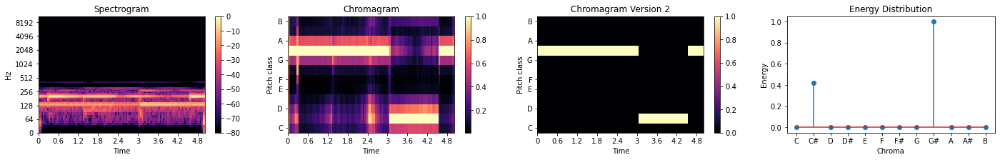

In [9]:
ans = visual_analysis(file_path=SaMa_St[0]['G_sharp'], global_threshold=0.9, duration=5, cutoff_high=50, cutoff_low=250)

In [10]:
tanpura_tuning(file_path=SaMa_St[0]['G_sharp'], global_threshold=0.9, duration=5, cutoff_high=50, cutoff_low=250)

('G#', 'C#')

## TanpuraDroid

### SaPa Tuning

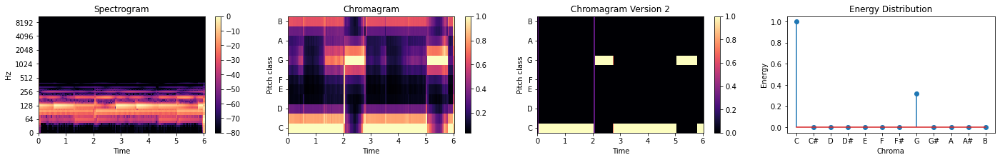

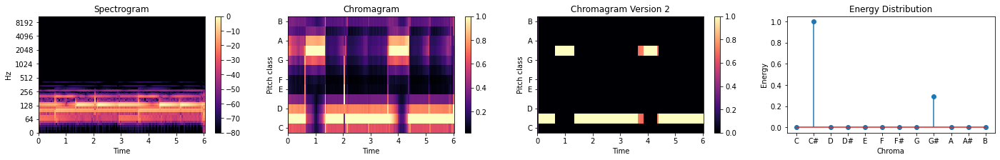

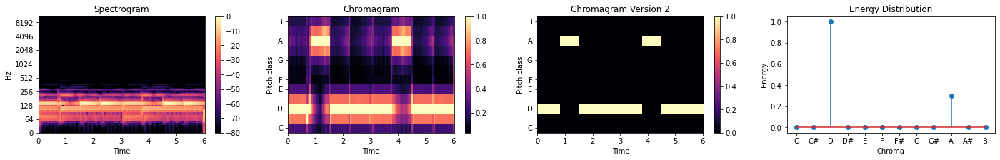

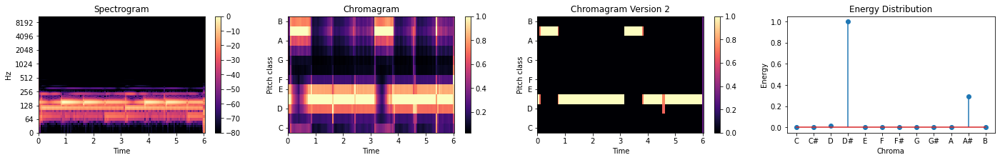

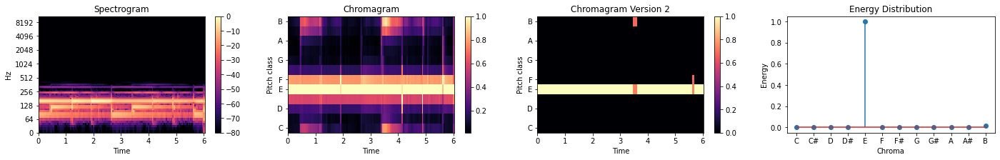

...

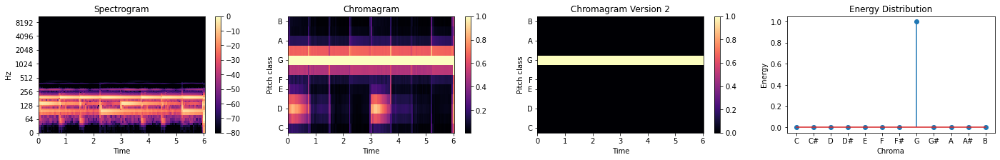

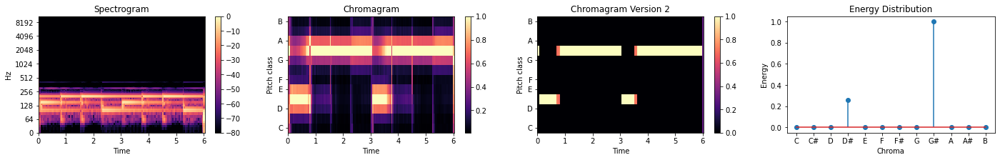

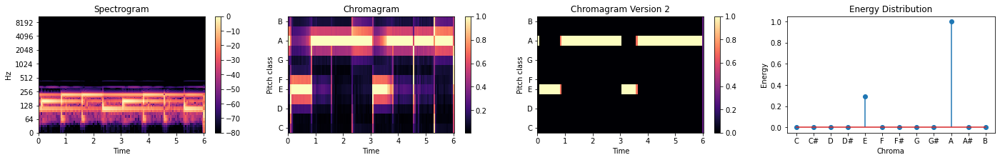

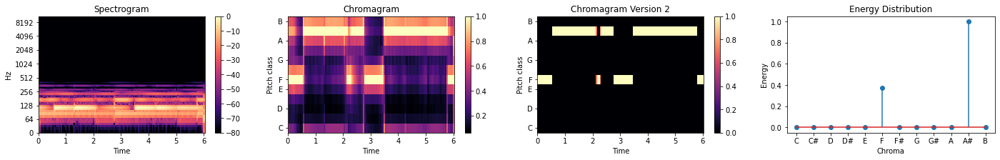

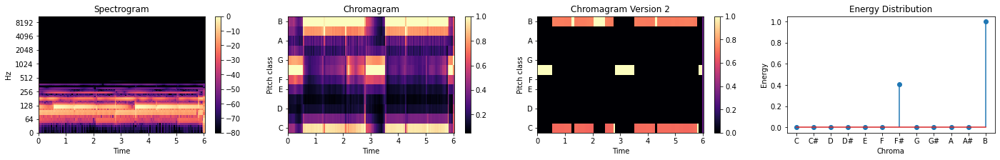

In [11]:
for name in SaPa_TD[0]:
    ans = visual_analysis(file_path=SaPa_TD[0][name], global_threshold=0.9, offset=0, duration=6)

In [12]:
for name in SaPa_TD[0]:
    tuning = tanpura_tuning(file_path=SaPa_TD[0][name], global_threshold=0.9, offset=0, duration=6)
    print(f"Tuning of {name} is {tuning}")

Tuning of C is ('C', 'G')
Tuning of C_sharp is ('C#', 'G#')
Tuning of D is ('D', 'A')
Tuning of D_sharp is ('D#', 'A#')
Tuning of E is ('E', 'B')
Tuning of F is ('F', 'C')
Tuning of F_sharp is ('F#', 'C')
Tuning of G is ('G', 'C')
Tuning of G_sharp is ('G#', 'D#')
Tuning of A is ('A', 'E')
Tuning of A_sharp is ('A#', 'F')
Tuning of B is ('B', 'F#')


### SaMa tuning

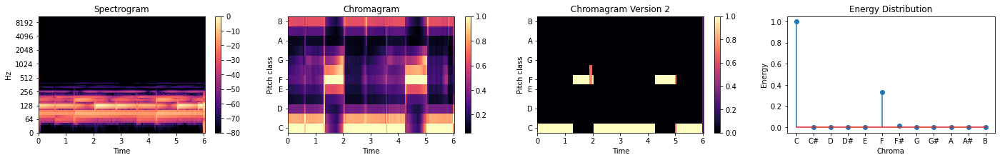

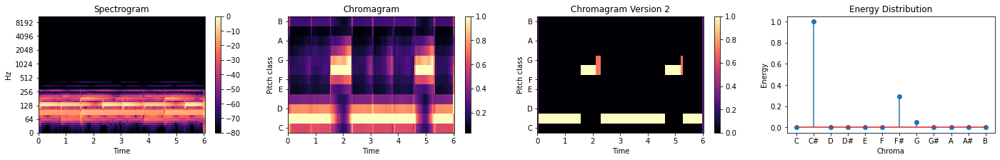

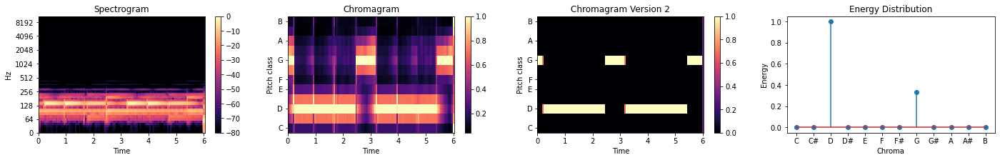

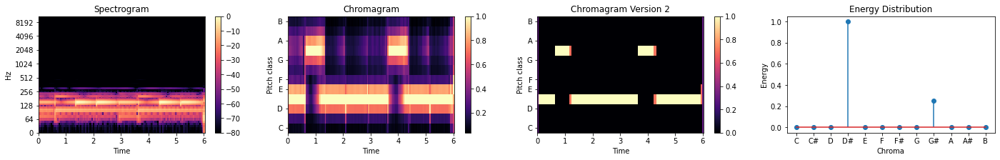

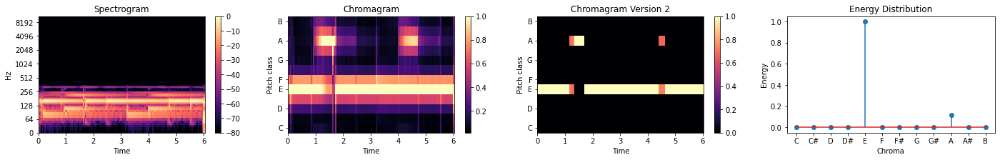

...

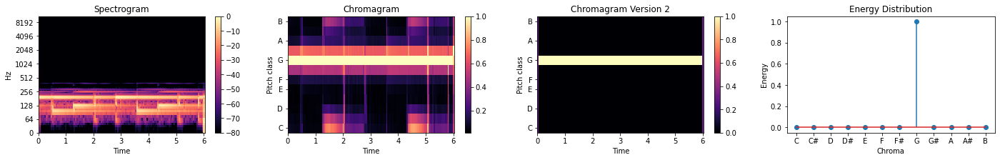

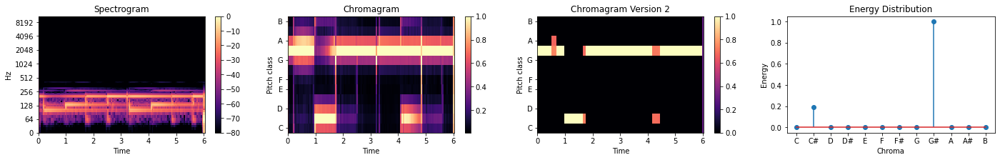

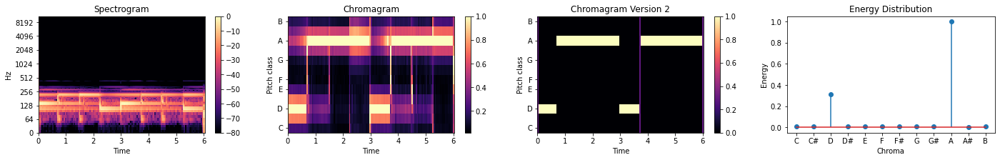

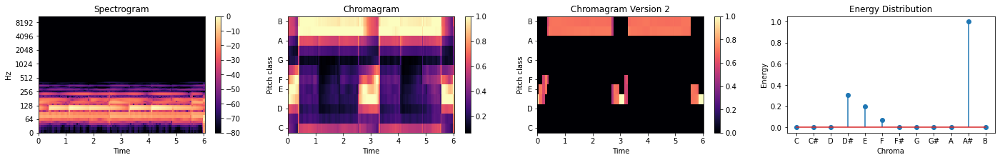

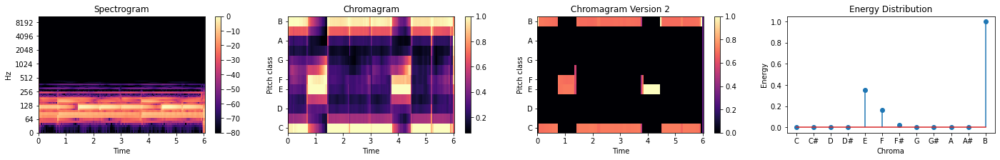

In [13]:
for name in SaMa_TD[0]:
    ans = visual_analysis(file_path=SaMa_TD[0][name], global_threshold=0.9, offset=0, duration=6)

In [14]:
for name in SaMa_TD[0]:
    tuning = tanpura_tuning(file_path=SaMa_TD[0][name], global_threshold=0.9, offset=0, duration=6)
    print(f"Tuning of {name} is {tuning}")

Tuning of C is ('C', 'F')
Tuning of C_sharp is ('C#', 'F#')
Tuning of D is ('D', 'G')
Tuning of D_sharp is ('D#', 'G#')
Tuning of E is ('E', 'A')
Tuning of F is ('F', 'A#')
Tuning of F_sharp is ('F#', 'B')
Tuning of G is ('G', 'C')
Tuning of G_sharp is ('G#', 'C#')
Tuning of A is ('A', 'D')
Tuning of A_sharp is ('A#', 'D#')
Tuning of B is ('B', 'E')


### SaNi Tuning

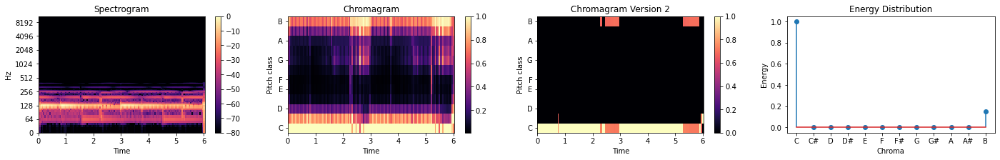

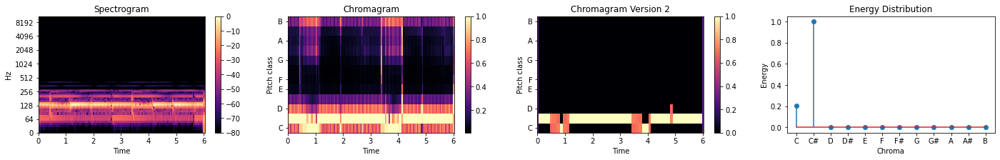

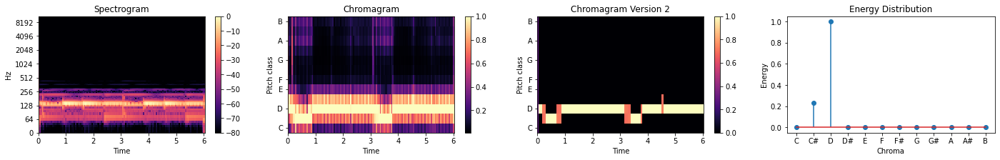

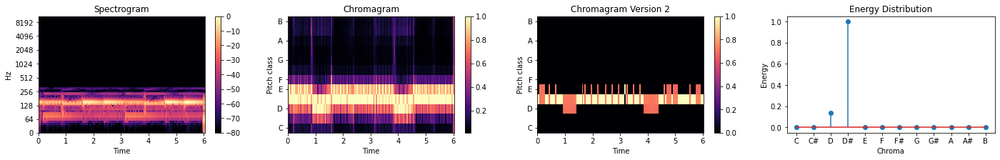

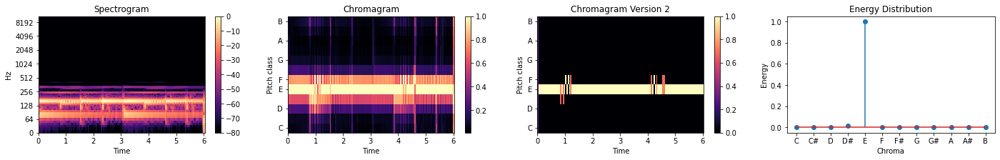

...

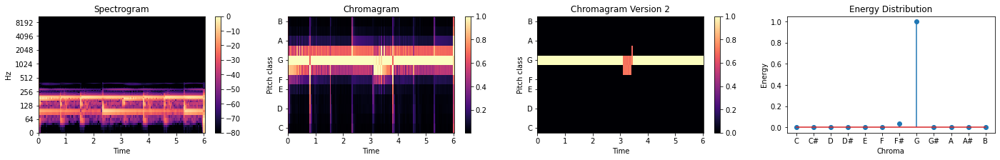

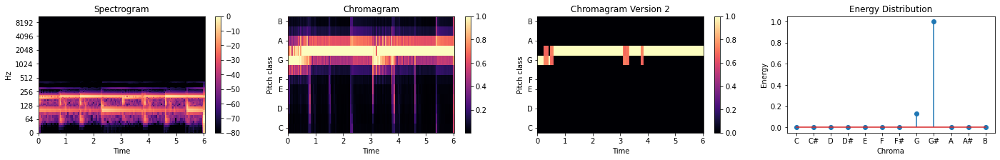

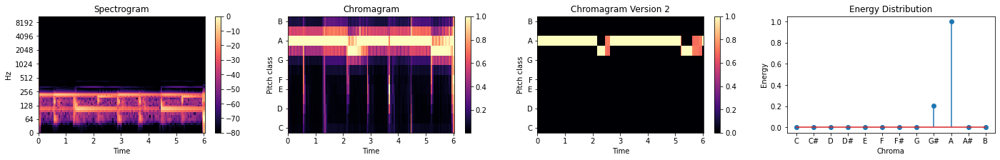

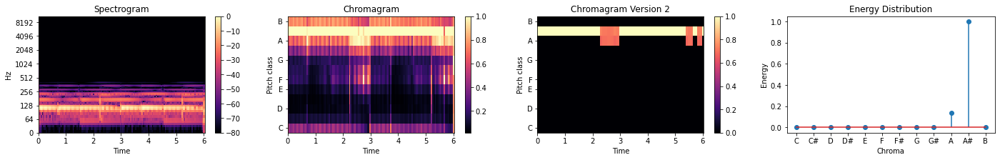

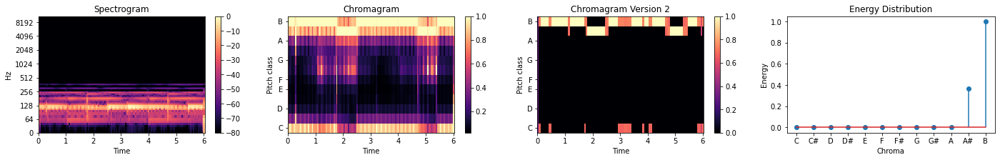

In [15]:
for name in SaNi_TD[0]:
    ans = visual_analysis(file_path=SaNi_TD[0][name], global_threshold=0.9, offset=0, duration=6)

In [16]:
for name in SaNi_TD[0]:
    tuning = tanpura_tuning(file_path=SaNi_TD[0][name], global_threshold=0.9, offset=0, duration=6)
    print(f"Tuning of {name} is {tuning}")

Tuning of C is ('C', 'B')
Tuning of C_sharp is ('C#', 'C')
Tuning of D is ('D', 'C#')
Tuning of D_sharp is ('D#', 'D')
Tuning of E is ('E', 'D#')
Tuning of F is ('F', 'E')
Tuning of F_sharp is ('F#', 'F')
Tuning of G is ('G', 'F#')
Tuning of G_sharp is ('G#', 'G')
Tuning of A is ('A', 'G#')
Tuning of A_sharp is ('A#', 'A')
Tuning of B is ('B', 'A#')


## Bandish

### SaPa Tuning

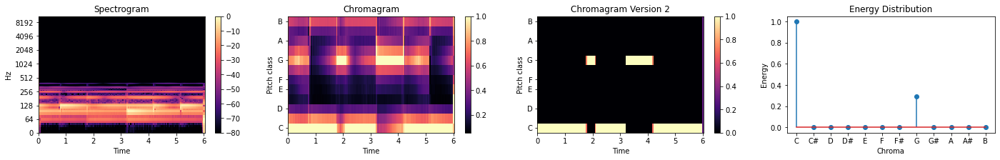

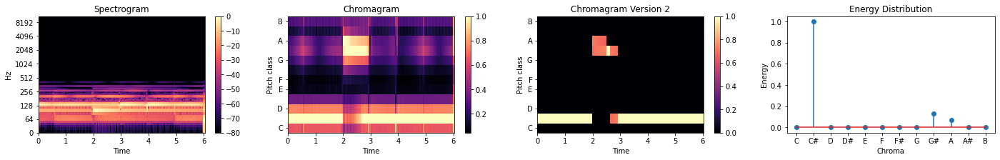

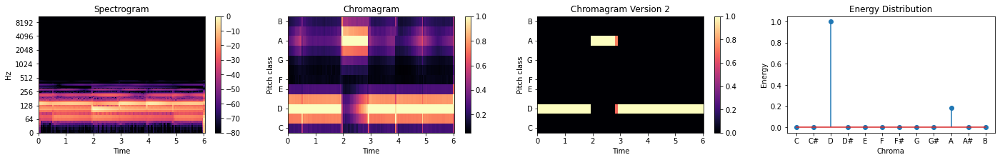

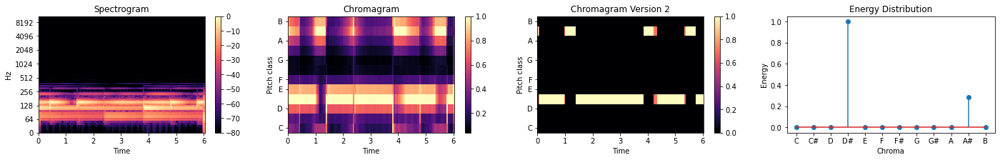

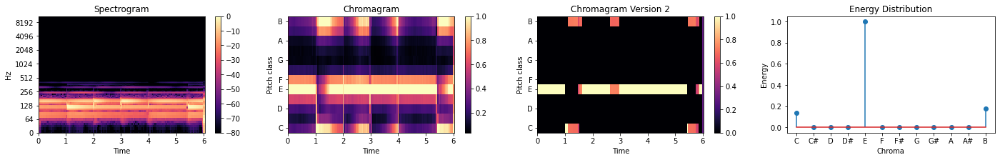

...

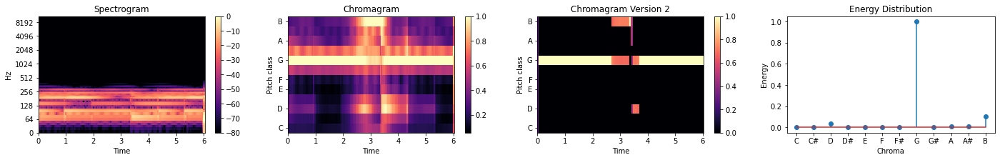

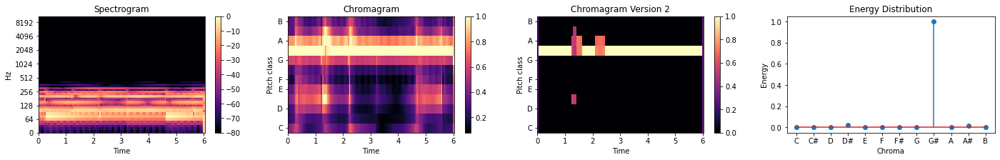

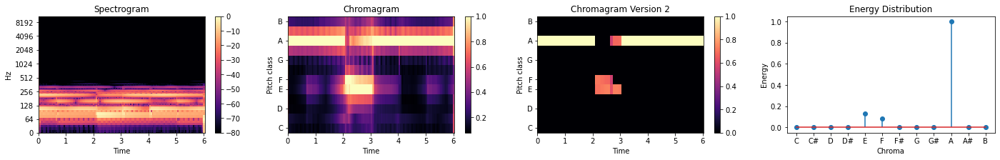

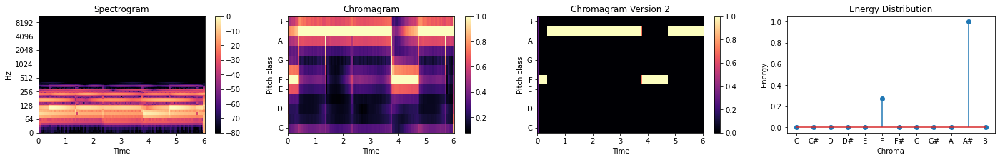

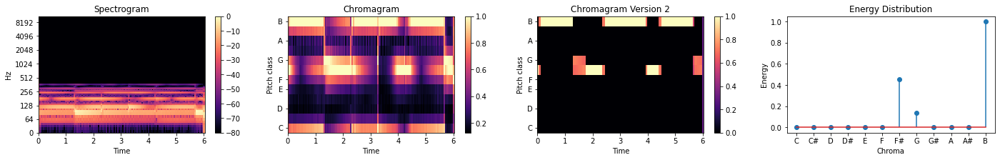

In [17]:
for name in SaPa_Bd[0]:
    ans = visual_analysis(file_path=SaPa_Bd[0][name], global_threshold=0.9, offset=0, duration=6)

In [18]:
for name in SaPa_Bd[0]:
    tuning = tanpura_tuning(file_path=SaPa_Bd[0][name], global_threshold=0.9, offset=0, duration=6)
    print(f"Tuning of {name} is {tuning}")

Tuning of C is ('C', 'G')
Tuning of C_sharp is ('C#', 'G#')
Tuning of D is ('D', 'A')
Tuning of D_sharp is ('D#', 'A#')
Tuning of E is ('E', 'B')
Tuning of F is ('F', 'C')
Tuning of F_sharp is ('F#', 'C#')
Tuning of G is ('G', 'B')
Tuning of G_sharp is ('G#', 'D#')
Tuning of A is ('A', 'E')
Tuning of A_sharp is ('A#', 'F')
Tuning of B is ('B', 'F#')


### SaMa Tuning

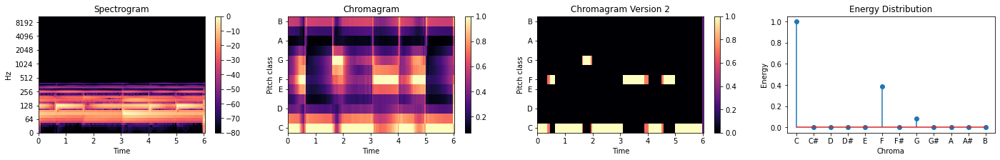

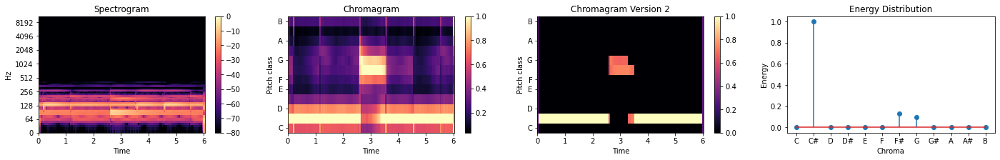

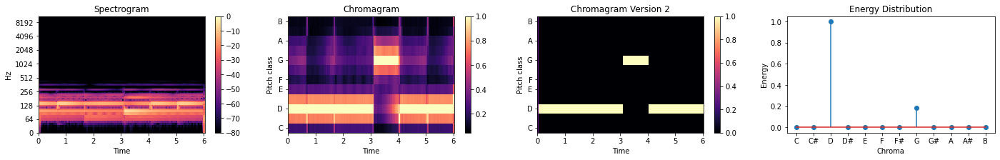

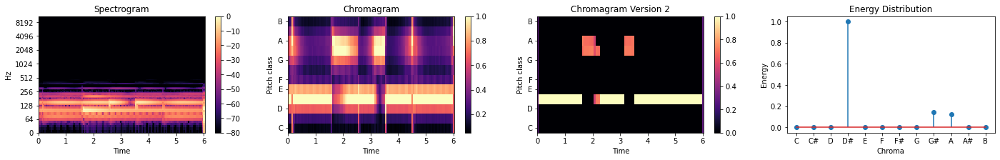

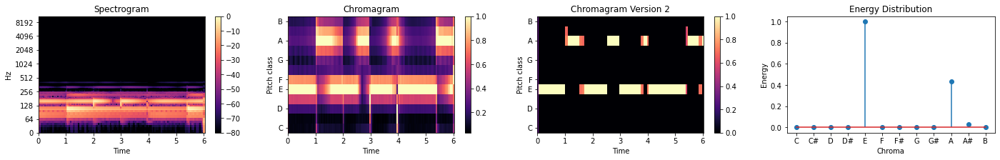

...

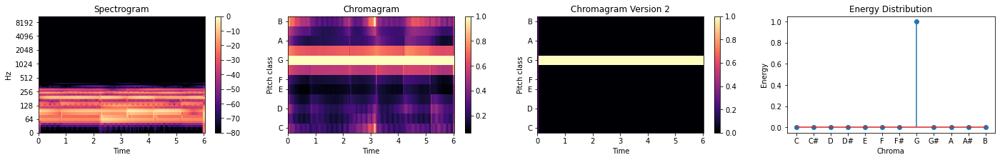

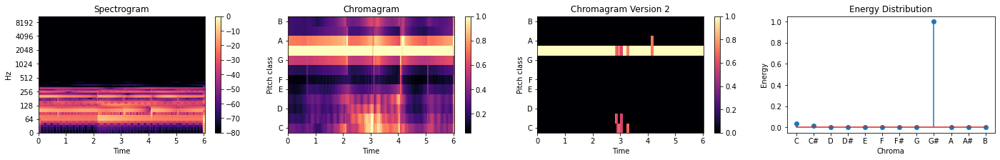

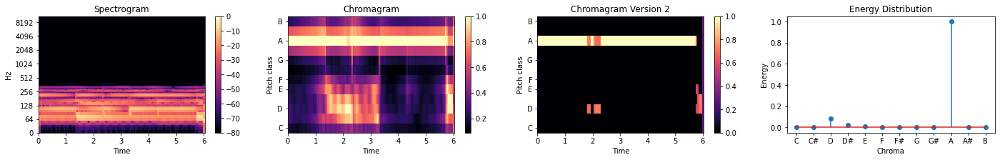

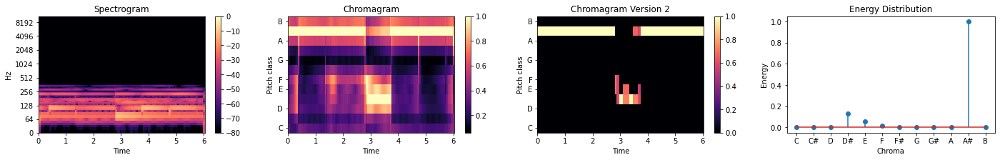

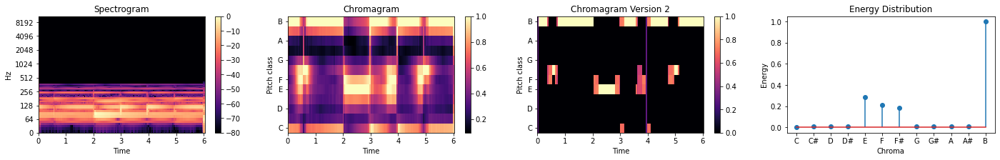

In [19]:
for name in SaMa_Bd[0]:
    ans = visual_analysis(file_path=SaMa_Bd[0][name], global_threshold=0.9, offset=0, duration=6)

In [20]:
for name in SaMa_Bd[0]:
    tuning = tanpura_tuning(file_path=SaMa_Bd[0][name], global_threshold=0.9, offset=0, duration=6)
    print(f"Tuning of {name} is {tuning}")

Tuning of C is ('C', 'F')
Tuning of C_sharp is ('C#', 'F#')
Tuning of D is ('D', 'G')
Tuning of D_sharp is ('D#', 'G#')
Tuning of E is ('E', 'A')
Tuning of F is ('F', 'A#')
Tuning of F_sharp is ('F#', 'B')
Tuning of G is ('G', 'C')
Tuning of G_sharp is ('G#', 'C')
Tuning of A is ('A', 'D')
Tuning of A_sharp is ('A#', 'D#')
Tuning of B is ('B', 'E')


### SaNi Tuning

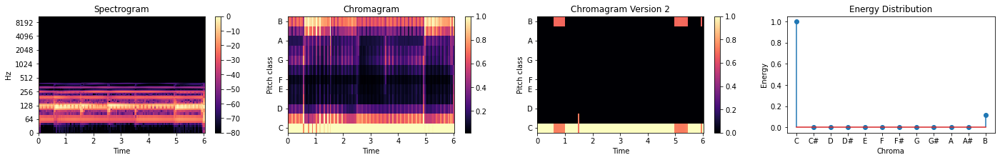

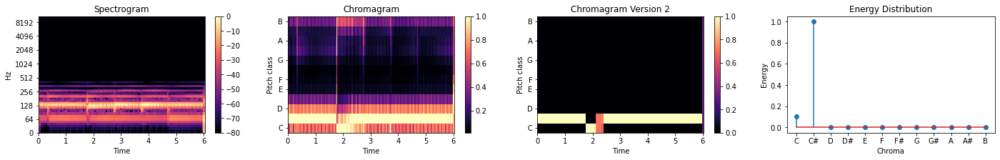

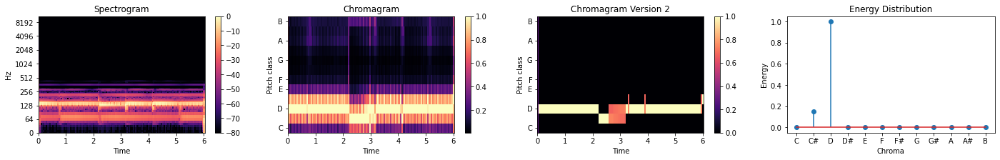

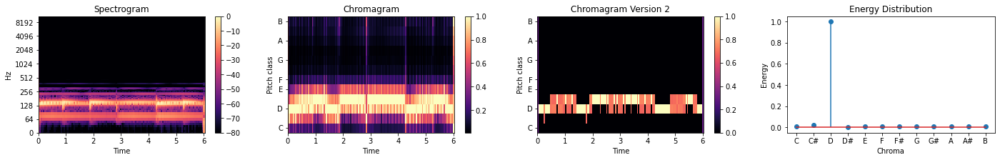

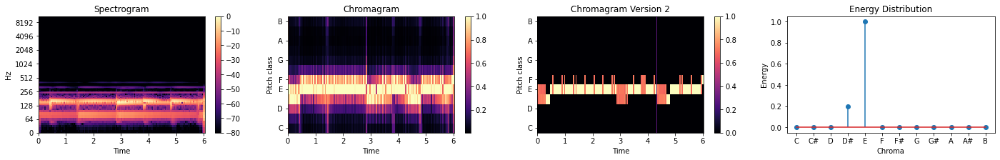

...

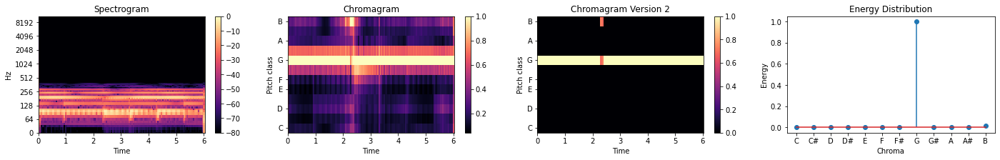

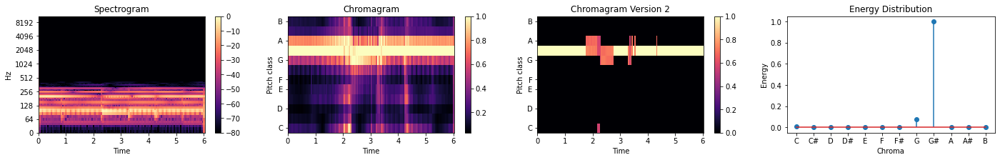

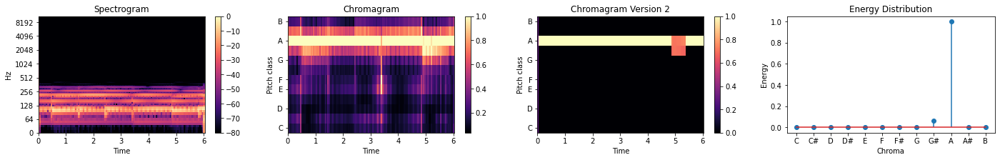

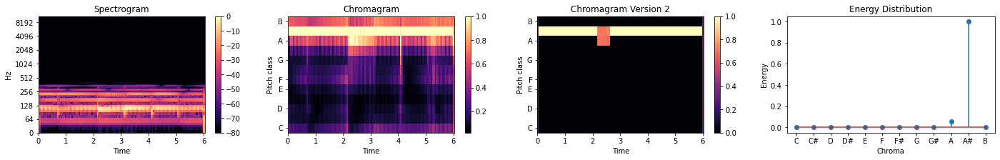

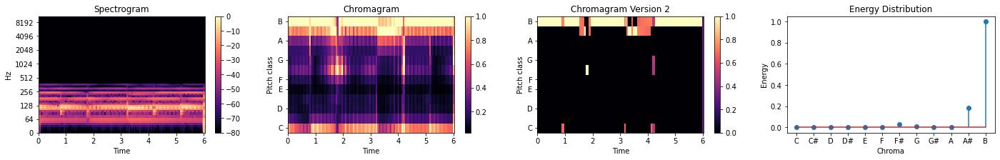

In [21]:
for name in SaNi_Bd[0]:
    ans = visual_analysis(file_path=SaNi_Bd[0][name], global_threshold=0.9, offset=0, duration=6)

In [22]:
for name in SaNi_Bd[0]:
    tuning = tanpura_tuning(file_path=SaNi_Bd[0][name], global_threshold=0.9, offset=0, duration=6)
    print(f"Tuning of {name} is {tuning}")

Tuning of C is ('C', 'B')
Tuning of C_sharp is ('C#', 'C')
Tuning of D is ('D', 'C#')
Tuning of D_sharp is ('D', 'C#')
Tuning of E is ('E', 'D#')
Tuning of F is ('F', 'E')
Tuning of F_sharp is ('F#', 'F')
Tuning of G is ('G', 'B')
Tuning of G_sharp is ('G#', 'G')
Tuning of A is ('A', 'G#')
Tuning of A_sharp is ('A#', 'A')
Tuning of B is ('B', 'A#')


## Singtico

### SaPa Tuning

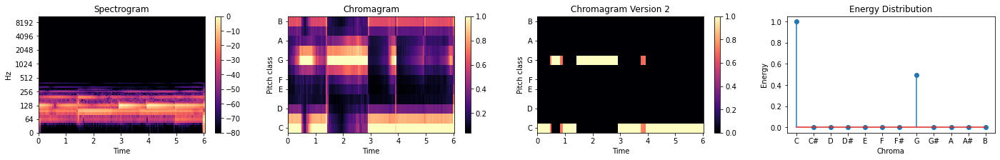

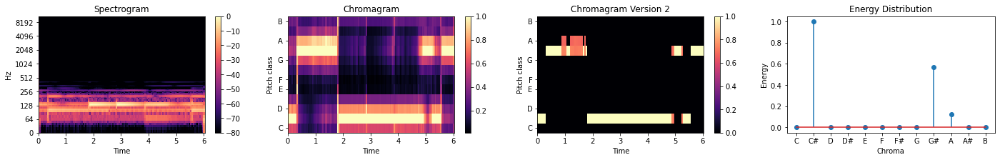

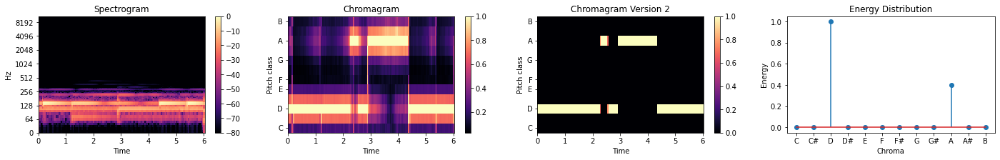

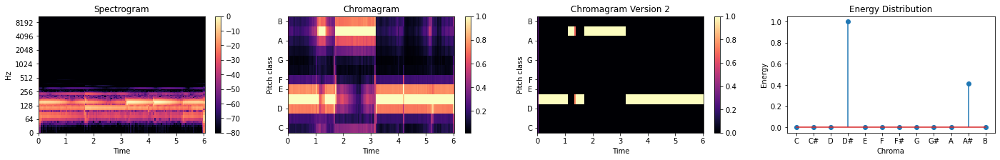

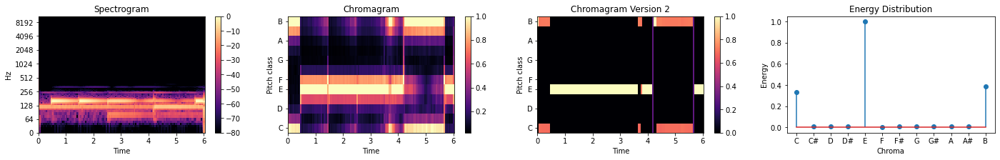

...

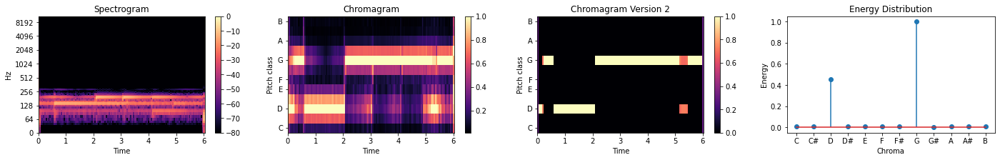

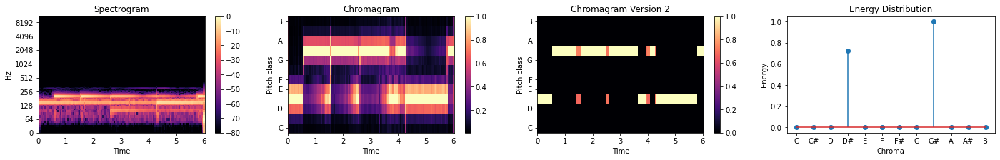

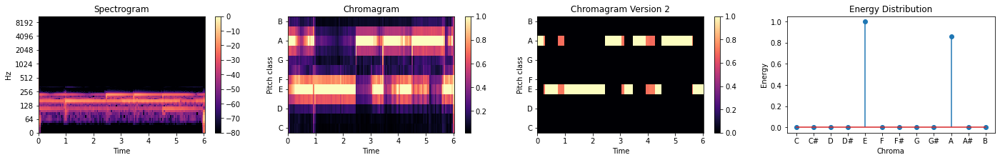

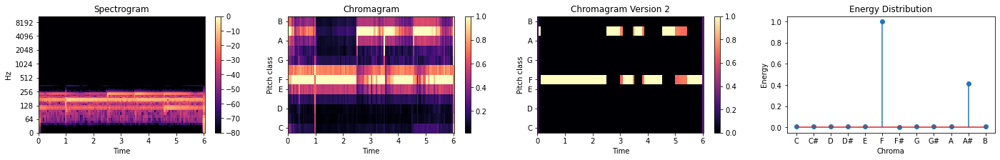

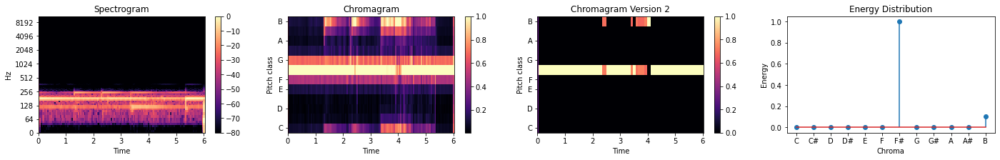

In [23]:
for name in SaPa_St[0]:
    ans = visual_analysis(file_path=SaPa_St[0][name], global_threshold=0.9, offset=0, duration=6)

In [24]:
for name in SaPa_St[0]:
    tuning = tanpura_tuning(file_path=SaPa_St[0][name], global_threshold=0.9, offset=0, duration=6)
    print(f"Tuning of {name} is {tuning}")

Tuning of C is ('C', 'G')
Tuning of C_sharp is ('C#', 'G#')
Tuning of D is ('D', 'A')
Tuning of D_sharp is ('D#', 'A#')
Tuning of E is ('E', 'B')
Tuning of F is ('F', 'C')
Tuning of F_sharp is ('F#', 'C#')
Tuning of G is ('G', 'D')
Tuning of G_sharp is ('G#', 'D#')
Tuning of A is ('E', 'A')
Tuning of A_sharp is ('F', 'A#')
Tuning of B is ('F#', 'B')


### SaMa Tuning

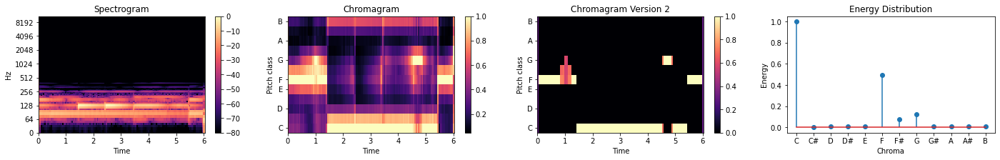

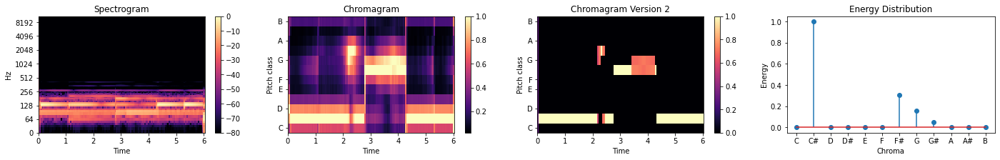

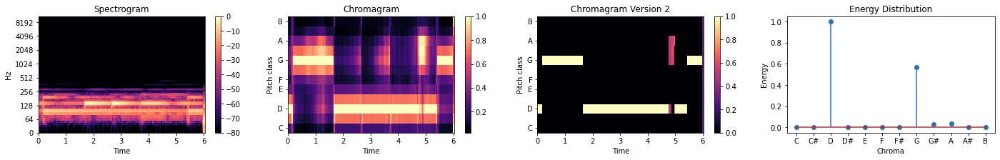

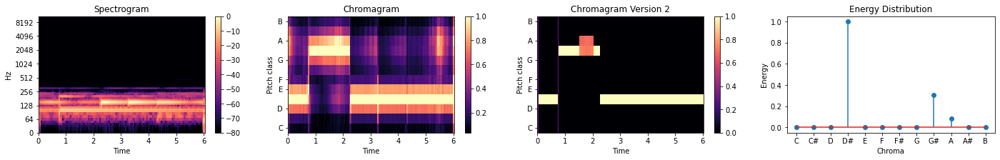

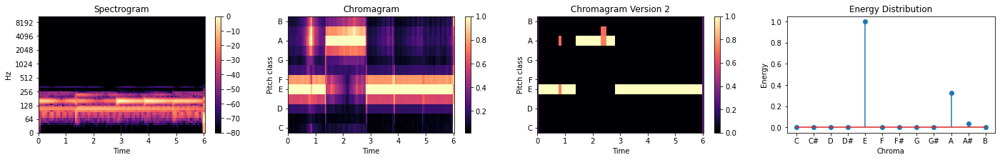

...

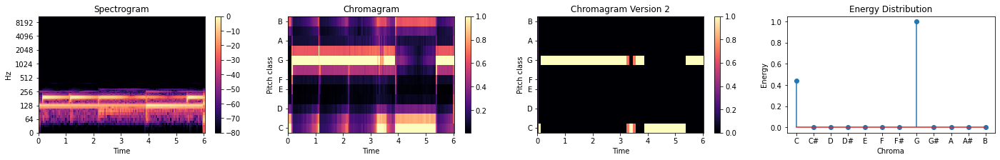

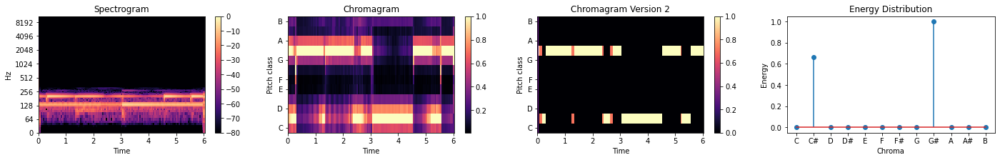

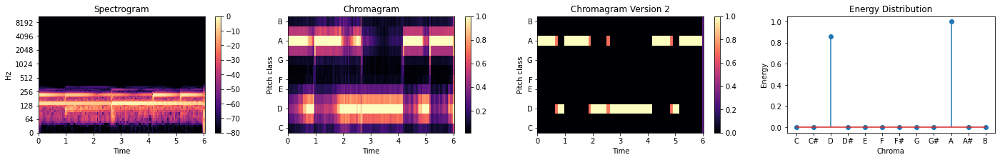

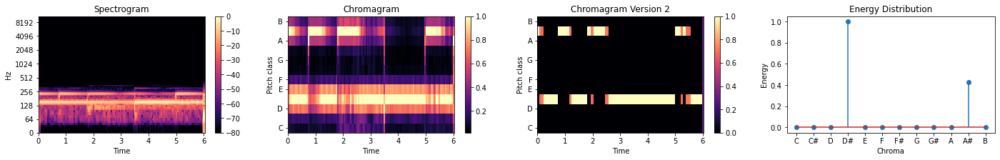

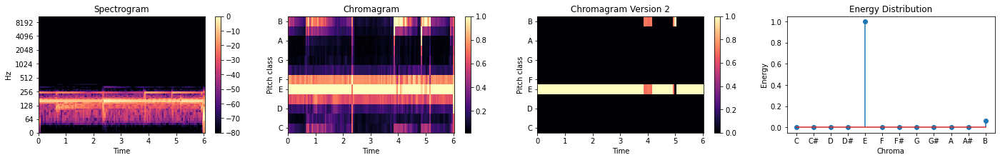

In [25]:
for name in SaMa_St[0]:
    ans = visual_analysis(file_path=SaMa_St[0][name], global_threshold=0.9, offset=0, duration=6)

In [26]:
for name in SaMa_St[0]:
    tuning = tanpura_tuning(file_path=SaMa_St[0][name], global_threshold=0.9, offset=0, duration=6)
    print(f"Tuning of {name} is {tuning}")

Tuning of C is ('C', 'F')
Tuning of C_sharp is ('C#', 'F#')
Tuning of D is ('D', 'G')
Tuning of D_sharp is ('D#', 'G#')
Tuning of E is ('E', 'A')
Tuning of F is ('F', 'A#')
Tuning of F_sharp is ('F#', 'B')
Tuning of G is ('G', 'C')
Tuning of G_sharp is ('G#', 'C#')
Tuning of A is ('A', 'D')
Tuning of A_sharp is ('D#', 'A#')
Tuning of B is ('E', 'B')


### SaNi Tuning

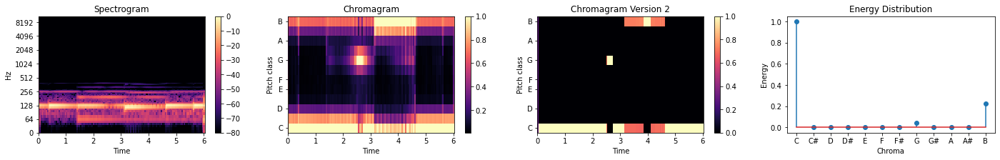

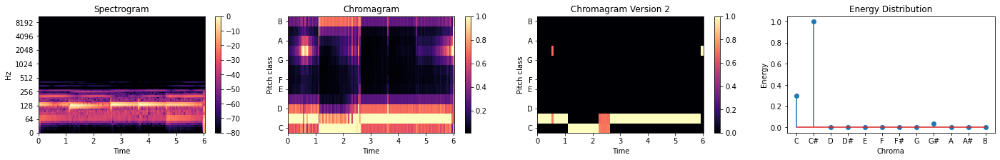

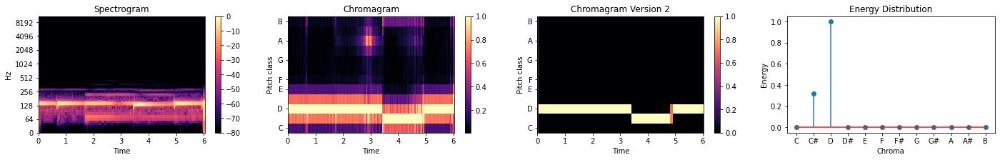

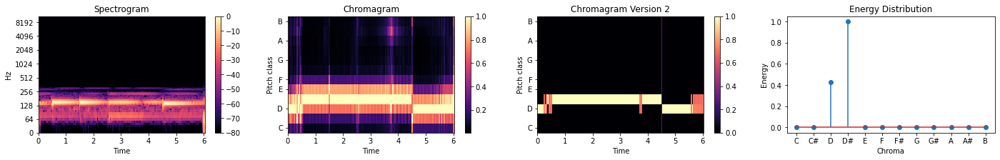

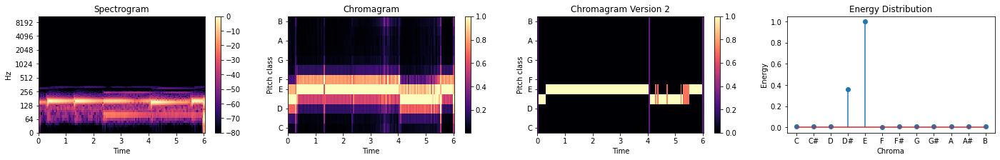

...

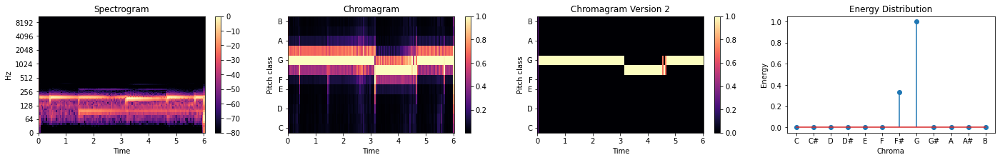

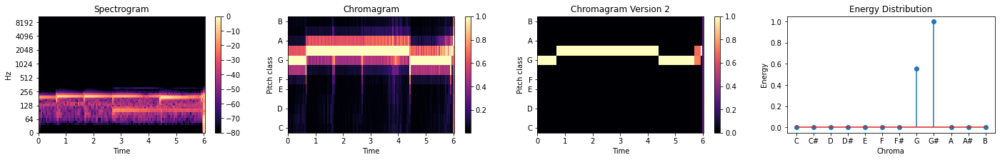

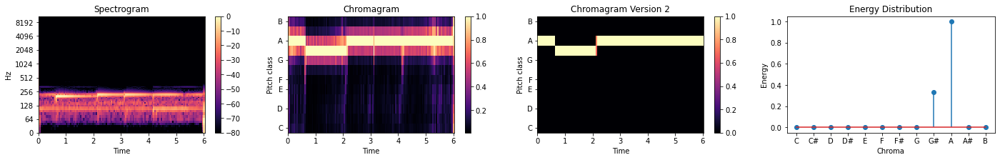

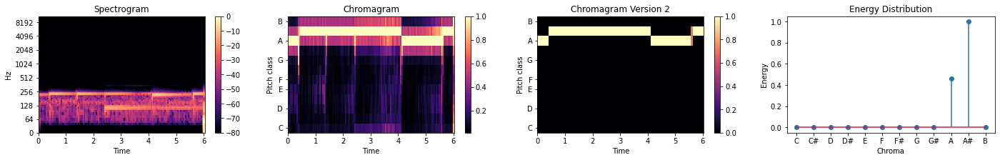

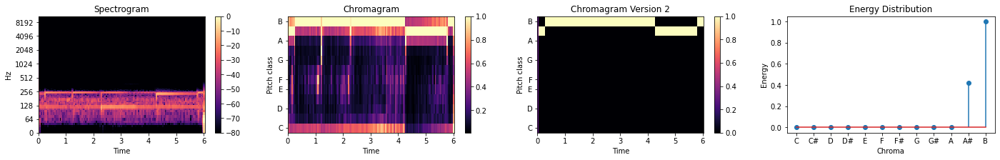

In [27]:
for name in SaNi_St[0]:
    ans = visual_analysis(file_path=SaNi_St[0][name], global_threshold=0.9, offset=0, duration=6)

In [28]:
for name in SaNi_St[0]:
    tuning = tanpura_tuning(file_path=SaNi_St[0][name], global_threshold=0.9, offset=0, duration=6)
    print(f"Tuning of {name} is {tuning}")

Tuning of C is ('C', 'B')
Tuning of C_sharp is ('C#', 'C')
Tuning of D is ('D', 'C#')
Tuning of D_sharp is ('D#', 'D')
Tuning of E is ('E', 'D#')
Tuning of F is ('F', 'E')
Tuning of F_sharp is ('F#', 'F')
Tuning of G is ('G', 'F#')
Tuning of G_sharp is ('G#', 'G')
Tuning of A is ('A', 'G#')
Tuning of A_sharp is ('A#', 'A')
Tuning of B is ('B', 'A#')


### Youtube Recordings

#### SaPa

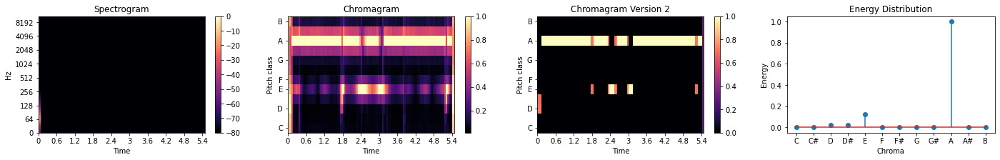

Tuning: ('A', 'E')


In [29]:
path = '../Tanpura Tuning project/Data/Youtube/SaPa_A_youtube_3.mp3'
ans = visual_analysis(file_path=path, offset=50, duration=15, cutoff_low=70, cutoff_high=300)
print('Tuning:',tanpura_tuning(file_path=path, offset=50, duration=15, cutoff_low=70, cutoff_high=300))

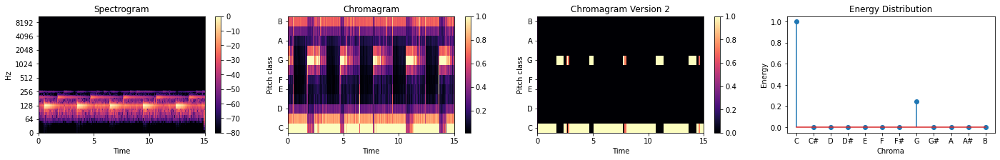

Tuning: ('C', 'G')


In [30]:
path = '../Tanpura Tuning project/Data/Youtube/SaPa_C_youtube_2.mp3'
ans = visual_analysis(file_path=path, offset=10, duration=15, cutoff_high=80, cutoff_low=160)
print('Tuning:',tanpura_tuning(file_path=path, offset=10, duration=15, cutoff_high=80, cutoff_low=160))

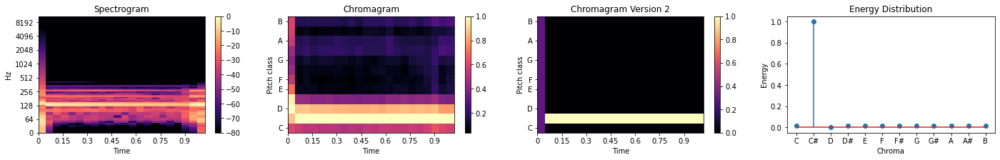

Tuning: ('C#', 'G#')


In [31]:
path = '../Tanpura Tuning project/Data/Youtube/SaPa_C_sharp_youtube_1.mp3'
ans = visual_analysis(file_path=path, offset=10, duration=1)
print('Tuning:',tanpura_tuning(file_path=path, offset=10, duration=15))

#### SaMa

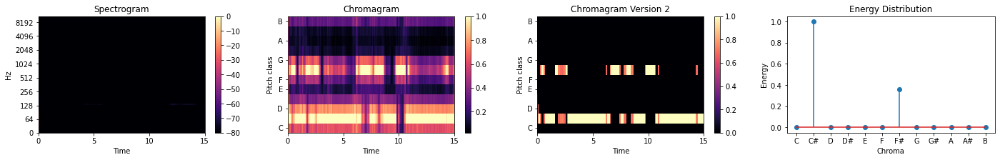

Tuning: ('C#', 'F#')


In [32]:
path = '../Tanpura Tuning project/Data/Youtube/SaMa_C_sharp_youtube_1.mp3'
ans = visual_analysis(file_path=path, offset=10, duration=15, cutoff_low=70, cutoff_high=170)
print('Tuning:',tanpura_tuning(file_path=path, offset=10, duration=15, cutoff_low=70, cutoff_high=170))

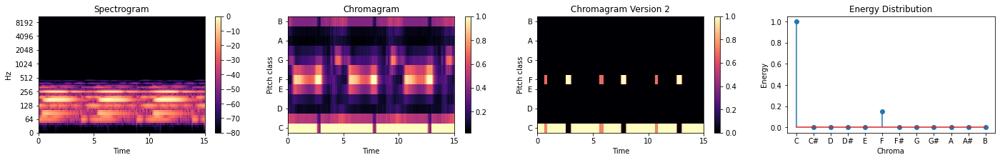

Tuning: ('C', 'F')


In [33]:
path = '../Tanpura Tuning project/Data/Youtube/SaMa_C_youtube_2.mp3'
ans = visual_analysis(file_path=path, offset=10, duration=15, cutoff_high=60, cutoff_low=300)
print('Tuning:',tanpura_tuning(file_path=path, offset=10, duration=15, cutoff_high=60, cutoff_low=300))

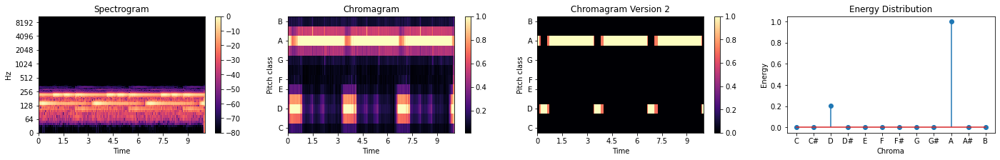

Tuning: ('A', 'D')


In [34]:
path = '../Tanpura Tuning project/Data/Youtube/SaMa_A_youtube_3.mp3'
ans = visual_analysis(file_path=path, offset=10, duration=10, cutoff_high=60, cutoff_low=200)
print('Tuning:',tanpura_tuning(file_path=path, offset=10, duration=10, cutoff_high=60, cutoff_low=200))

#### SaNi

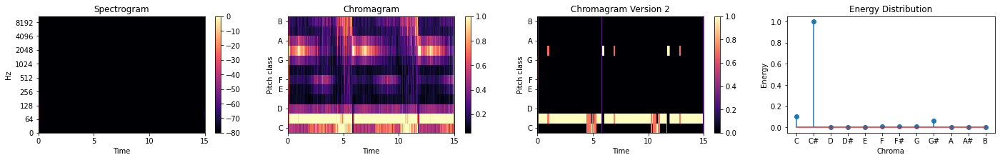

Tuning: ('C#', 'C')


In [35]:
path = '../Tanpura Tuning project/Data/Youtube/SaNi_C_sharp_youtube_1.mp3'
ans = visual_analysis(file_path=path, offset=10, duration=15, cutoff_low=90, cutoff_high=250)
print('Tuning:',tanpura_tuning(file_path=path, offset=10, duration=15, cutoff_low=90, cutoff_high=250))

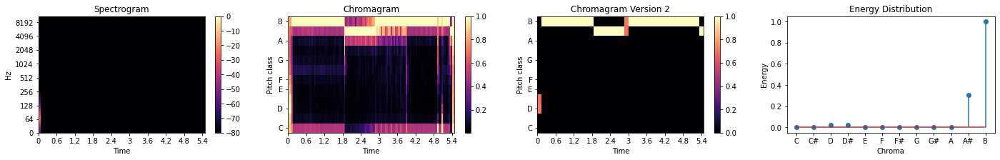

Tuning: ('B', 'A#')


In [36]:
path = '../Tanpura Tuning project/Data/Youtube/SaNi_B_youtube_2.mp3'
ans = visual_analysis(file_path=path, offset=50, duration=15, cutoff_low=70, cutoff_high=300)
print('Tuning:',tanpura_tuning(file_path=path, offset=50, duration=15, cutoff_low=70, cutoff_high=300))

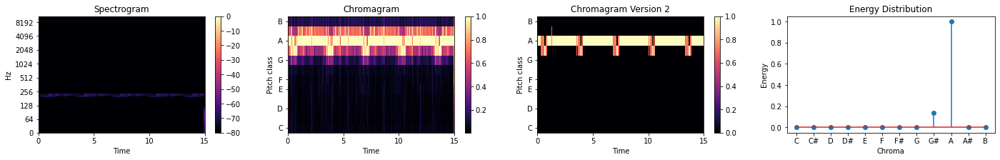

Tuning: ('A', 'G#')


In [37]:
path = '../Tanpura Tuning project/Data/Youtube/SaNi_A_youtube_3.mp3'
ans = visual_analysis(file_path=path, offset=10, duration=15, cutoff_low=90, cutoff_high=200)
print('Tuning:',tanpura_tuning(file_path=path, offset=10, duration=15, cutoff_low=90, cutoff_high=200))

## Results for OSF database

/home/vivek-grover/anaconda3/envs/FMP/lib/python3.8/site-packages/librosa/core/pitch.py:153: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn("Trying to estimate tuning from empty frequency set.")


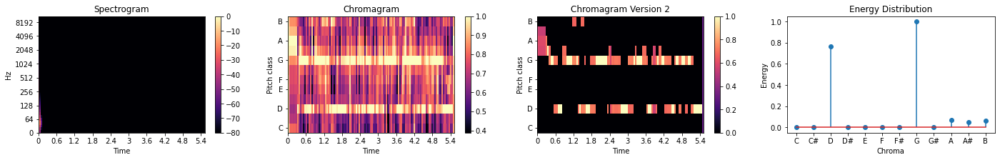

Tuning: ('G', 'D')


/home/vivek-grover/anaconda3/envs/FMP/lib/python3.8/site-packages/librosa/core/pitch.py:153: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn("Trying to estimate tuning from empty frequency set.")


In [38]:
path = '../Tanpura Tuning project/Data/OSF Database/Tanpura_MAK_Jaun.mp3'
ans = visual_analysis(file_path=path, cutoff_low=50, cutoff_high=600)
tuning = tanpura_tuning(file_path=path, cutoff_low=50, cutoff_high=600)
print('Tuning:', tuning)
a = ipd.Audio('../Tanpura Tuning project/Data/OSF Database/Tanpura_MAK_Jaun.mp3')
ipd.display(a)

In [39]:
a = ipd.Audio(SaPa_TD[0]['G']) # For comaprison by listening
ipd.display(a)

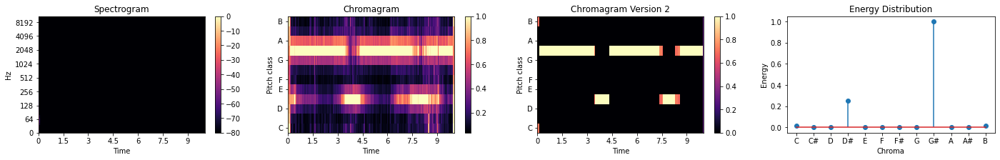

Tuning: ('G#', 'D#')


In [40]:
path = '../Tanpura Tuning project/Data/OSF Database/Tanpura_MAK_Jhin.mp3'
ans = visual_analysis(file_path=path, cutoff_low=60, cutoff_high=300)
tuning = tanpura_tuning(file_path=path, cutoff_low=60, cutoff_high=300)
print('Tuning:', tuning)
a = ipd.Audio('../Tanpura Tuning project/Data/OSF Database/Tanpura_MAK_Jhin.mp3')
ipd.display(a)

In [41]:
a = ipd.Audio(SaPa_TD[0]['G_sharp']) # For comaprison by listening
ipd.display(a)

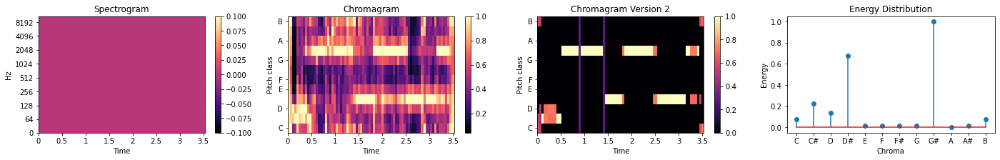

Tuning: ('G#', 'D#')


In [42]:
path = '../Tanpura Tuning project/Data/OSF Database/Tanpura_MAK_Tilakk.mp3'
ans = visual_analysis(file_path=path, cutoff_low=60, cutoff_high=300)
tuning = tanpura_tuning(file_path=path, cutoff_low=60, cutoff_high=300)
print('Tuning:', tuning)
a = ipd.Audio('../Tanpura Tuning project/Data/OSF Database/Tanpura_MAK_Tilakk.mp3')
ipd.display(a)

In [43]:
a = ipd.Audio(SaPa_TD[0]['G_sharp']) # For comaprison by listening
ipd.display(a)

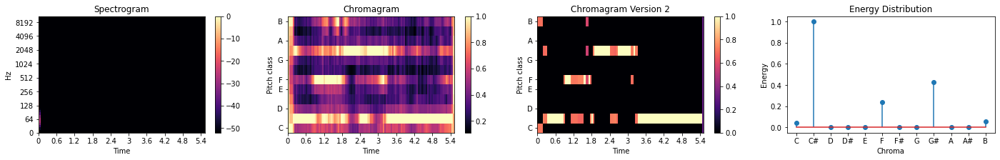

Tuning: ('C#', 'G#')


In [44]:
path = '../Tanpura Tuning project/Data/OSF Database/Tanpura_VK_Multani.mp3'
ans = visual_analysis(file_path=path, cutoff_low=60, cutoff_high=600)
tuning = tanpura_tuning(file_path=path, cutoff_low=60, cutoff_high=600)
print('Tuning:', tuning)
a = ipd.Audio('../Tanpura Tuning project/Data/OSF Database/Tanpura_VK_Multani.mp3')
ipd.display(a)

In [45]:
a = ipd.Audio(SaPa_TD[0]['C_sharp'])
ipd.display(a)

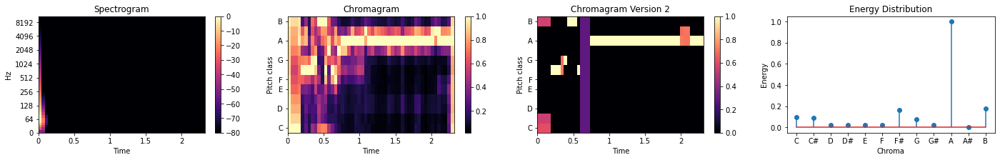

Tuning: ('A', 'B')


In [46]:
path = '../Tanpura Tuning project/Data/OSF Database/Tanpura_VS_Bhoop.mp3'
ans = visual_analysis(file_path=path, cutoff_low=60, cutoff_high=300)
tuning = tanpura_tuning(file_path=path, cutoff_low=60, cutoff_high=300)
print('Tuning:', tuning)
a = ipd.Audio('../Tanpura Tuning project/Data/OSF Database/Tanpura_VS_Bhoop.mp3')
ipd.display(a)

In [47]:
a = ipd.Audio(SaPa_TD[0]['A'])
ipd.display(a)